In [1]:
# Importing all the Required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from tqdm import tqdm_notebook
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Lets see what is in the Data
df = pd.read_csv('./../cleaned_dataset_2023.csv')
df.head()

,Date_of_journey,Journey_day,Airline,Flight_code,Class,Source,Departure,Total_stops,Arrival,Destination,Duration_in_hours,Days_left,Fare
0,16-01-2023,Monday,SpiceJet,SG-8169,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.0833,1,5335
1,16-01-2023,Monday,Indigo,6E-2519,Economy,Delhi,After 6 PM,non-stop,Before 6 AM,Mumbai,2.3333,1,5899
2,16-01-2023,Monday,GO FIRST,G8-354,Economy,Delhi,After 6 PM,non-stop,Before 6 AM,Mumbai,2.1667,1,5801
3,16-01-2023,Monday,SpiceJet,SG-8709,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.0833,1,5794
4,16-01-2023,Monday,Air India,AI-805,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.1667,1,5955


In [3]:
df.isnull().sum()

Date_of_journey      0
Journey_day          0
Airline              0
Flight_code          0
Class                0
Source               0
Departure            0
Total_stops          0
Arrival              0
Destination          0
Duration_in_hours    0
Days_left            0
Fare                 0
dtype: int64

In [4]:
# A Quick Information abou the Data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452088 entries, 0 to 452087
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Date_of_journey    452088 non-null  object 
 1   Journey_day        452088 non-null  object 
 2   Airline            452088 non-null  object 
 3   Flight_code        452088 non-null  object 
 4   Class              452088 non-null  object 
 5   Source             452088 non-null  object 
 6   Departure          452088 non-null  object 
 7   Total_stops        452088 non-null  object 
 8   Arrival            452088 non-null  object 
 9   Destination        452088 non-null  object 
 10  Duration_in_hours  452088 non-null  float64
 11  Days_left          452088 non-null  int64  
 12  Fare               452088 non-null  int64  
dtypes: float64(1), int64(2), object(10)
memory usage: 44.8+ MB


In [5]:
# Stastical Description of Data
df.describe()

,Duration_in_hours,Days_left,Fare
count,452088.000000,452088.000000,452088.000000
mean,12.349222,25.627902,22840.100890
std,7.431478,14.300846,20307.963002
min,0.750000,1.000000,1307.000000
25%,6.583300,13.000000,8762.750000
50%,11.333300,26.000000,13407.000000
75%,16.500000,38.000000,35587.000000
max,43.583300,50.000000,143019.000000


In [6]:
df.corr().T

,Duration_in_hours,Days_left,Fare
Duration_in_hours,1.000000,-0.032878,0.179909
Days_left,-0.032878,1.000000,-0.087852
Fare,0.179909,-0.087852,1.000000


In [7]:
# Size of the data 
df.shape

(452088, 13)

In [8]:
df = df.dropna()
df.drop_duplicates( keep=False, inplace=True)
df = df.reset_index(drop = True)
df.shape

(440087, 13)

In [9]:
df1=df.groupby(['Airline','Flight_code'],as_index=False).count()
df1.Airline.value_counts()

Indigo         702
Air India      171
Vistara        165
AirAsia        106
GO FIRST       104
SpiceJet        92
AkasaAir        51
AllianceAir     10
StarAir          4
Name: Airline, dtype: int64

<b> Indigo becaming as a most popular Airline

In [10]:
df2 = df.groupby(['Flight_code','Airline','Class'],as_index=False).count()
df2['Class'].value_counts()

Economy            1401
Business            295
Premium Economy     137
First                 3
Name: Class, dtype: int64

<b> Most of the Airlines has Economic Class as common

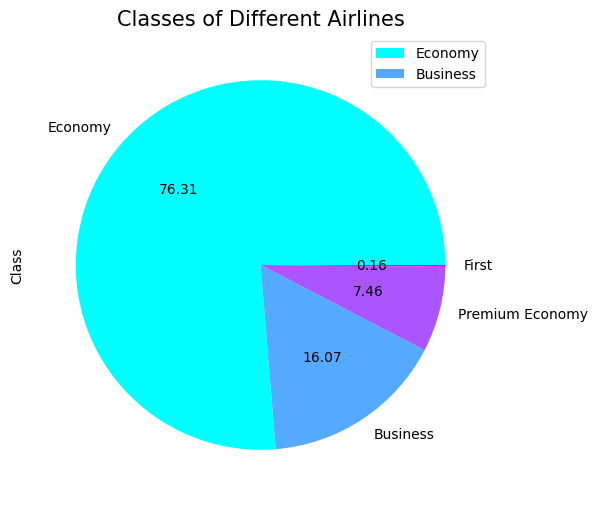

In [11]:
plt.figure(figsize=(8,6))
df2['Class'].value_counts().plot(kind='pie',textprops={'color':'black'},autopct='%.2f',cmap='cool')
plt.title('Classes of Different Airlines',fontsize=15)
plt.legend(['Economy','Business'])
plt.show()

<b> Do prices vary with Airlines?</b>

<p>
    
<ul>
    <li>As we can see Vistara has Maximum Price range</li>
    <li>Vistara and Air_India Airlines Have Maximum Price when compared to Others</li>
    <li>SpiceJet , AirAsia , GO_First and Indigo has some what equal prices</li>  
    
</ul>
</p>

In [12]:
fig = px.box(df, y = "Fare", x = 'Airline', color_discrete_sequence = ["orange"], template = 'seaborn')
fig.show()

<p>
    <b> Does the Ticket Price vary between Economy and Business Class?</b>
   
<ul> 
    <li>Ticket Price is Maximum for Bussiness Class When compared to Economy Class</li>
</ul>
    </p>

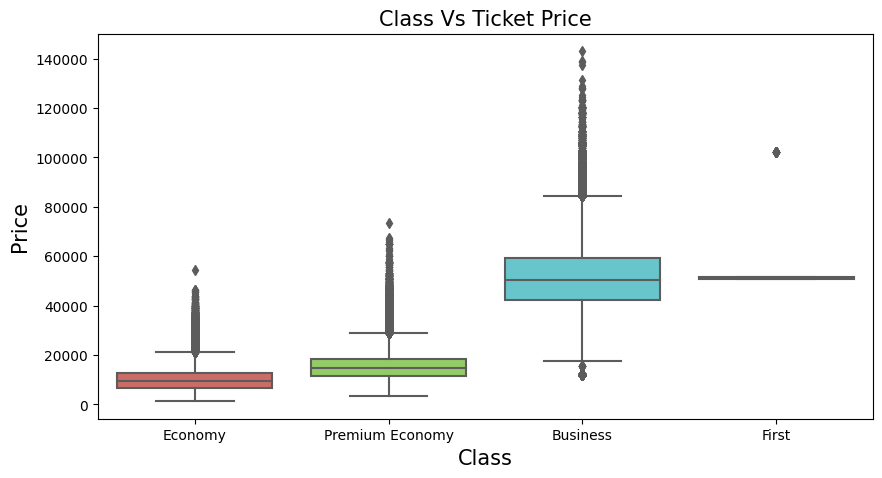

In [13]:
plt.figure(figsize=(10,5))
sns.boxplot(x='Class',y='Fare',data=df,palette='hls')
plt.title('Class Vs Ticket Price',fontsize=15)
plt.xlabel('Class',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

<b> How Does the Ticket Price vary with the number of stops of a Flight?</b>

<p> 
<ul><li>Flights having one stop has maximum ticket price</li></ul>
</p>

In [14]:
df.columns

Index(['Date_of_journey', 'Journey_day', 'Airline', 'Flight_code', 'Class',
       'Source', 'Departure', 'Total_stops', 'Arrival', 'Destination',
       'Duration_in_hours', 'Days_left', 'Fare'],
      dtype='object')

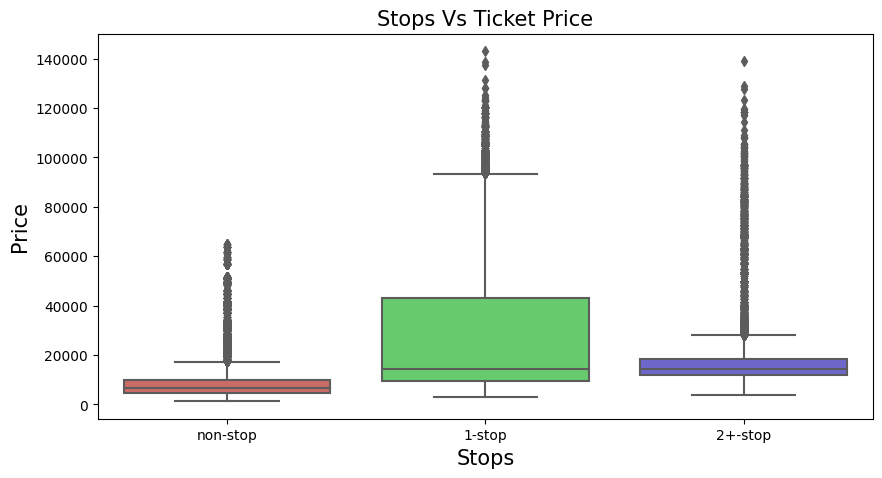

In [15]:
plt.figure(figsize=(10,5))
sns.boxplot(x='Total_stops',y='Fare',data=df,palette='hls')
plt.title('Stops Vs Ticket Price',fontsize=15)
plt.xlabel('Stops',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

<p>
    
<b> How the Ticket Price change based on the Departure Time and Arrival Time?</b><br>

    
<b>1. Departure Time Vs Ticket Price</b>

   <ul>
   <li> Ticket Price is More for the Flights when the Departure Time is at Night</li>
   <li>Ticket Price is almost equal for flights Having Departure time at Early_morning , Morning and Evening</li>
   <li>Ticket Price is Low for the Flights Having Departure Time at Late_night</li>
   </ul>
    
 
 
<b>2. Arrival Time Vs Ticket Price</b>

   <ul>
    <li>Ticket Price is More for the Flights when the Arrival Time is at Evening</li>
    <li>Ticket Price is almost equal for flights Having Arrival time is at Morning and Night</li>
   <li>Ticket Price is Low for the Flights Having Arrival Time at Late_night as same as Departure Time</li>
    </ul>
 </p>

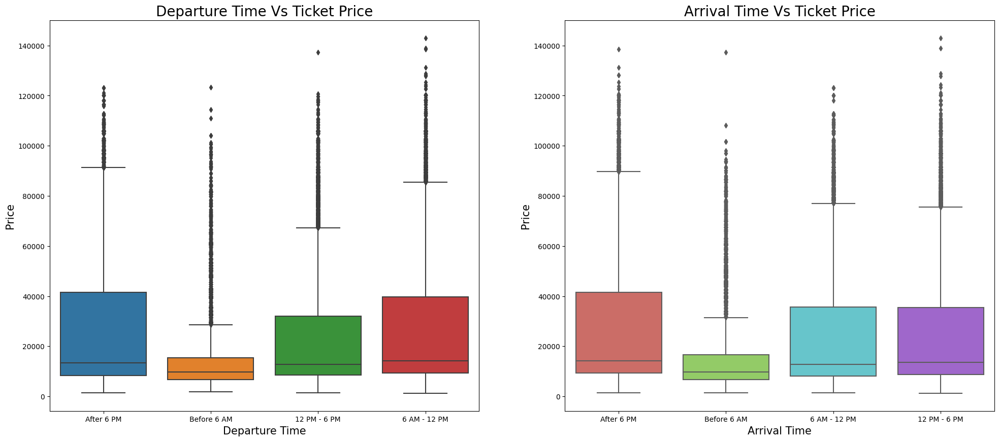

In [16]:
plt.figure(figsize=(24,10))
plt.subplot(1,2,1)
sns.boxplot(x='Departure',y='Fare',data=df)
plt.title('Departure Time Vs Ticket Price',fontsize=20)
plt.xlabel('Departure Time',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.subplot(1,2,2)
sns.boxplot(x='Arrival',y='Fare',data=df,palette='hls')
plt.title('Arrival Time Vs Ticket Price',fontsize=20)
plt.xlabel('Arrival Time',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

<p>
<b> How the price changes with change in Source city and Destination city?</b><br>
    
<b>1. Source City Vs Ticket Price</b>

   <li> Ticket Price is More for the Flights whose Source City is Kolkata</li>
   <li>Ticket Price is almost equal for flights Having Source Cities as Mumbai and chennai , Hyderabad and Bangalore</li>
    <li> Ticket Price is Low for the Flights Having Source City as Delhi</li>
    
 
<b>2. Destination City Vs Ticket Price</b>

   <li> Ticket Price is More for the Flights whose Destination City is kolkata and Chennai</li>
   <li> Ticket Price is almost equal for flights Having Destination Cities as Mumbai and Bangalore</li>
   <li>Ticket Price is Low for the Flights Having Destination City as Delhi</li>
</p>

In [17]:
df.columns

Index(['Date_of_journey', 'Journey_day', 'Airline', 'Flight_code', 'Class',
       'Source', 'Departure', 'Total_stops', 'Arrival', 'Destination',
       'Duration_in_hours', 'Days_left', 'Fare'],
      dtype='object')

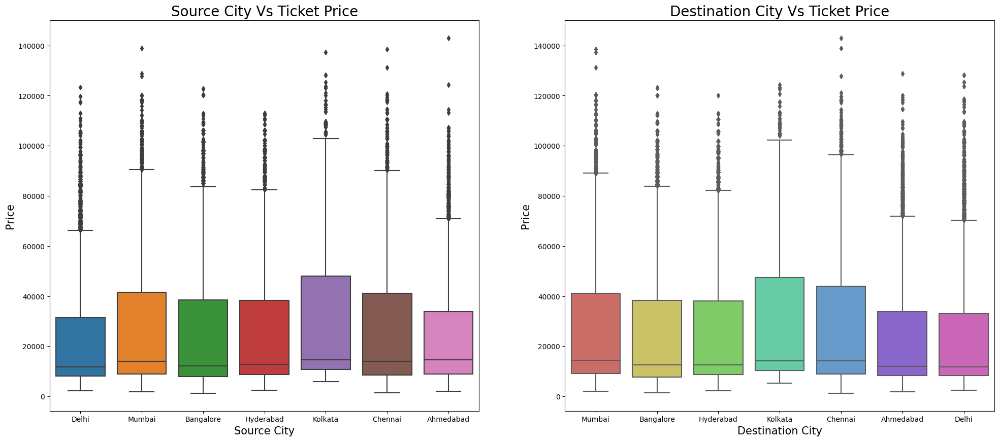

In [18]:
plt.figure(figsize=(24,10))
plt.subplot(1,2,1)
sns.boxplot(x='Source',y='Fare',data=df)
plt.title('Source City Vs Ticket Price',fontsize=20)
plt.xlabel('Source City',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.subplot(1,2,2)
sns.boxplot(x='Destination',y='Fare',data=df,palette='hls')
plt.title('Destination City Vs Ticket Price',fontsize=20)
plt.xlabel('Destination City',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

<p>
    <b> How Price Varies with the Flight Duration Based on Class?</b>

<li> With increase in Duration, the Ticket Price is also Increases In both the Economy and Business classes</li>
</p>


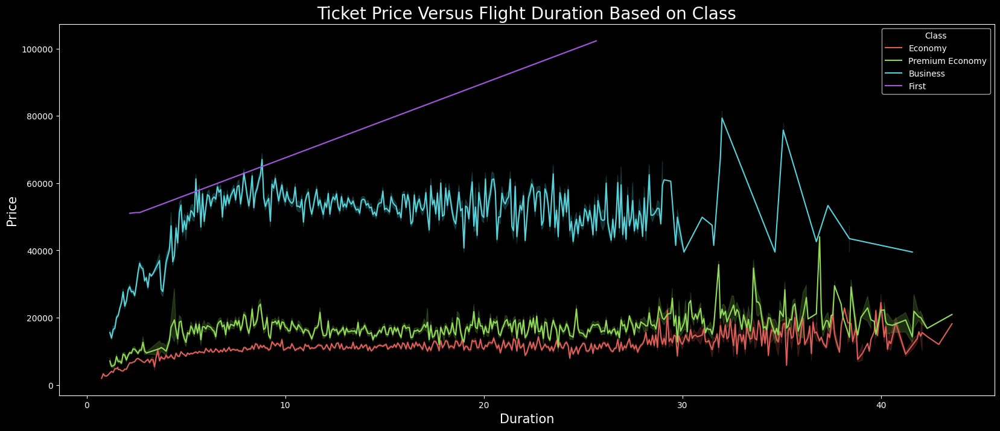

In [19]:
plt.style.use('dark_background')
plt.figure(figsize=(20,8))
sns.lineplot(data = df,x = 'Duration_in_hours',y = 'Fare',hue = 'Class',palette = 'hls')
plt.title('Ticket Price Versus Flight Duration Based on Class',fontsize = 20)
plt.xlabel('Duration',fontsize = 15)
plt.ylabel('Price',fontsize = 15)
plt.show()

<p>
    <b> How does the price affected on the days left for Departure?</b>
    
<li> As we can see when compared to others when there are two days remaining for departure then the Ticket Price is very High for all airlines</li>
    
</p>

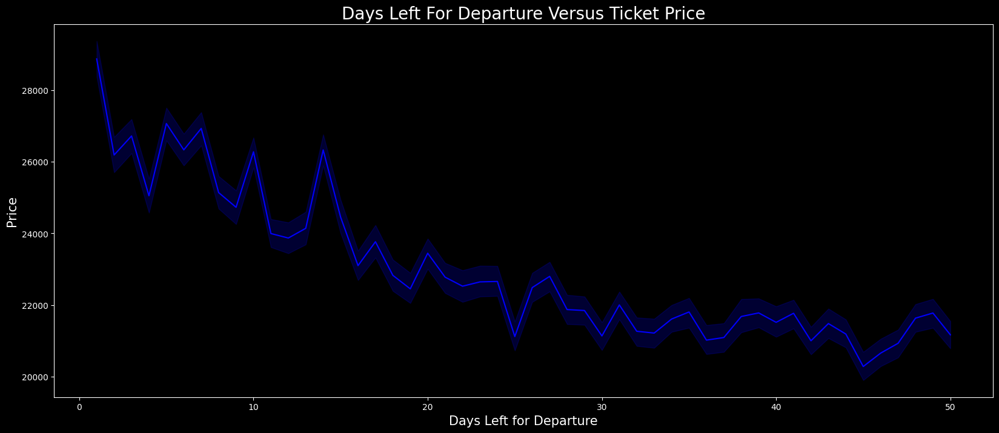

In [20]:
plt.figure(figsize=(20,8))
sns.lineplot(data=df,x='Days_left',y='Fare',color='blue')
plt.title('Days Left For Departure Versus Ticket Price',fontsize=20)
plt.xlabel('Days Left for Departure',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

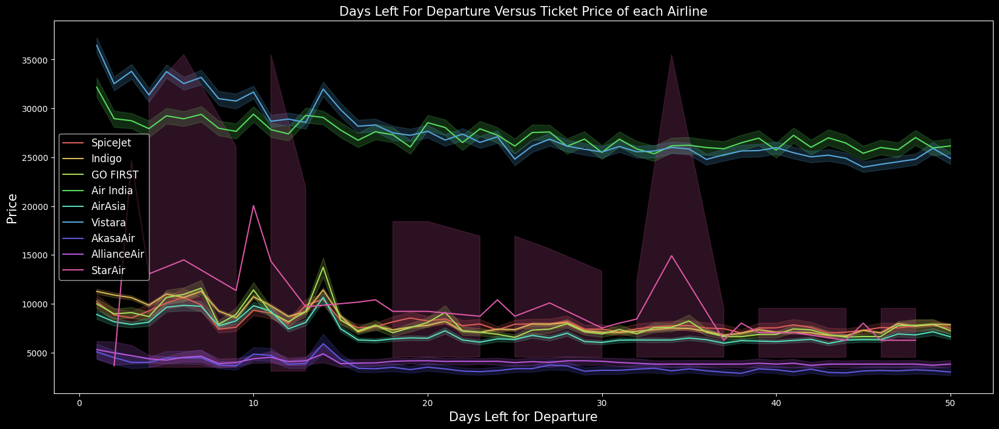

In [21]:
plt.figure(figsize=(20,8))
sns.lineplot(data=df,x='Days_left',y='Fare',color='blue',hue='Airline',palette='hls')
plt.title('Days Left For Departure Versus Ticket Price of each Airline',fontsize=15)
plt.legend(fontsize=12)
plt.xlabel('Days Left for Departure',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

<b> Total number of Flights from one city to another</b>

In [22]:
df.groupby(['Flight_code','Source','Destination','Airline','Class'],as_index=False).count().groupby(['Source','Destination'],as_index=False)['Flight_code'].count().head(10)

,Source,Destination,Flight_code
0,Ahmedabad,Bangalore,85
1,Ahmedabad,Chennai,82
2,Ahmedabad,Delhi,64
3,Ahmedabad,Hyderabad,77
4,Ahmedabad,Kolkata,88
5,Ahmedabad,Mumbai,50
6,Bangalore,Ahmedabad,136
7,Bangalore,Chennai,97
8,Bangalore,Delhi,181
9,Bangalore,Hyderabad,119


<b> Average Price of different Airlnes from Source city to Destination city</b>

In [23]:
df.groupby(['Airline','Source','Destination'],as_index=False)['Fare'].mean().head(10)

,Airline,Source,Destination,Fare
0,Air India,Ahmedabad,Bangalore,30898.056017
1,Air India,Ahmedabad,Chennai,31986.554209
2,Air India,Ahmedabad,Delhi,25284.740260
3,Air India,Ahmedabad,Hyderabad,28618.727551
4,Air India,Ahmedabad,Kolkata,30114.170294
5,Air India,Ahmedabad,Mumbai,31228.560304
6,Air India,Bangalore,Ahmedabad,28063.483264
7,Air India,Bangalore,Chennai,28978.088460
8,Air India,Bangalore,Delhi,23134.751645
9,Air India,Bangalore,Hyderabad,27742.954733


In [24]:
# Coverting the labels into a numeric form using Label Encoder
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for col in df.columns:
    if df[col].dtype=='object':
        df[col]=le.fit_transform(df[col])

In [25]:
# storing the Dependent Variables in X and Independent Variable in Y
x=df.drop(['Fare'],axis=1)
y=df['Fare']

In [26]:
# Splitting the Data into Training set and Testing Set
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=42)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((308060, 12), (132027, 12), (308060,), (132027,))

In [27]:
# Scaling the values to convert the int values to Machine Languages
from sklearn.preprocessing import MinMaxScaler
mmscaler=MinMaxScaler(feature_range=(0,1))
x_train=mmscaler.fit_transform(x_train)
x_test=mmscaler.fit_transform(x_test)
x_train=pd.DataFrame(x_train)
x_test=pd.DataFrame(x_test)  

In [28]:
a={'Model Name':[], 'Mean_Absolute_Error_MAE':[] ,'Adj_R_Square':[] ,'Root_Mean_Squared_Error_RMSE':[] ,'Mean_Absolute_Percentage_Error_MAPE':[] ,'Mean_Squared_Error_MSE':[] ,'Root_Mean_Squared_Log_Error_RMSLE':[] ,'R2_score':[]}
Results=pd.DataFrame(a)
Results.head()

,Model Name,Mean_Absolute_Error_MAE,Adj_R_Square,Root_Mean_Squared_Error_RMSE,Mean_Absolute_Percentage_Error_MAPE,Mean_Squared_Error_MSE,Root_Mean_Squared_Log_Error_RMSLE,R2_score


In [29]:
# Build the Regression / Regressor models

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn import linear_model
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
import xgboost as xgb
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import GradientBoostingRegressor

# Create objects of Regression / Regressor models with default hyper-parameters

modelmlg = LinearRegression()
modeldcr = DecisionTreeRegressor()
#modelbag = BaggingRegressor()
modelrfr = RandomForestRegressor()
modelSVR = SVR()
modelXGR = xgb.XGBRegressor()
modelKNN = KNeighborsRegressor(n_neighbors=5)
modelETR = ExtraTreesRegressor()
modelRE=Ridge()
modelLO=linear_model.Lasso(alpha=0.1)

modelGBR = GradientBoostingRegressor(loss='squared_error', learning_rate=0.1, n_estimators=100, subsample=1.0,
                                     criterion='friedman_mse', min_samples_split=2, min_samples_leaf=1,
                                     min_weight_fraction_leaf=0.0, max_depth=3, min_impurity_decrease=0.0,
                                     init=None, random_state=None, max_features=None,
                                     alpha=0.9, verbose=0, max_leaf_nodes=None, warm_start=False,
                                     validation_fraction=0.1, n_iter_no_change=None, tol=0.0001, ccp_alpha=0.0)

# Evalution matrix for all the algorithms

MM = [modelmlg, modeldcr, modelETR, modelGBR, modelXGR, modelRE, modelLO]

for models in tqdm_notebook(MM):
    
    # Fit the model with train data
    
    models.fit(x_train, y_train)
    
    # Predict the model with test data

    y_pred = models.predict(x_test)
    
    # Print the model name
    
    #print('Model Name: ', models)
    
    # Evaluation metrics for Regression analysis

    from sklearn import metrics

    # print('Mean Absolute Error (MAE):', round(metrics.mean_absolute_error(y_test, y_pred),3))  
    # print('Mean Squared Error (MSE):', round(metrics.mean_squared_error(y_test, y_pred),3))  
    # print('Root Mean Squared Error (RMSE):', round(np.sqrt(metrics.mean_squared_error(y_test, y_pred)),3))
    # print('R2_score:', round(metrics.r2_score(y_test, y_pred),6))
    # print('Root Mean Squared Log Error (RMSLE):', round(np.log(np.sqrt(metrics.mean_squared_error(y_test, y_pred))),3))
    
    # Define the function to calculate the MAPE - Mean Absolute Percentage Error

    def MAPE (y_test, y_pred):
        y_test, y_pred = np.array(y_test), np.array(y_pred)
        return np.mean(np.abs((y_test - y_pred) / y_test)) * 100
    
    # Evaluation of MAPE 

    result = MAPE(y_test, y_pred)
    # print('Mean Absolute Percentage Error (MAPE):', round(result, 2), '%')
    
    # Calculate Adjusted R squared values 

    r_squared = round(metrics.r2_score(y_test, y_pred),6)
    adjusted_r_squared = round(1 - (1-r_squared)*(len(y)-1)/(len(y)-x.shape[1]-1),6)
    # print('Adj R Square: ', adjusted_r_squared)
    # print('------------------------------------------------------------------------------------------------------------')
    #-------------------------------------------------------------------------------------------
    new_row = {'Model Name' : models,
               'Mean_Absolute_Error_MAE' : metrics.mean_absolute_error(y_test, y_pred),
               'Adj_R_Square' : adjusted_r_squared,
               'Root_Mean_Squared_Error_RMSE' : np.sqrt(metrics.mean_squared_error(y_test, y_pred)),
               'Mean_Absolute_Percentage_Error_MAPE' : result,
               'Mean_Squared_Error_MSE' : metrics.mean_squared_error(y_test, y_pred),
               'Root_Mean_Squared_Log_Error_RMSLE': np.log(np.sqrt(metrics.mean_squared_error(y_test, y_pred))),
               'R2_score' : metrics.r2_score(y_test, y_pred)}
    Results = Results.append(new_row, ignore_index=True)
    #------------------------------------------------------------

  0%|          | 0/7 [00:00<?, ?it/s]

In [30]:
Results

,Model Name,Mean_Absolute_Error_MAE,Adj_R_Square,Root_Mean_Squared_Error_RMSE,Mean_Absolute_Percentage_Error_MAPE,Mean_Squared_Error_MSE,Root_Mean_Squared_Log_Error_RMSLE,R2_score
0,LinearRegression(),12358.484839,0.461185,15008.492686,92.823384,2.252549e+08,9.616371,0.461200
1,DecisionTreeRegressor(),2134.367054,0.936166,5165.849363,9.849756,2.668600e+07,8.549825,0.936168
2,"(ExtraTreeRegressor(random_state=292621998), E...",1818.060675,0.963697,3895.746167,8.459047,1.517684e+07,8.267641,0.963698
3,([DecisionTreeRegressor(criterion='friedman_ms...,3946.810000,0.902034,6399.621818,21.732347,4.095516e+07,8.763994,0.902037
4,"XGBRegressor(base_score=None, booster=None, ca...",2688.715264,0.948753,4628.637525,13.957609,2.142429e+07,8.440018,0.948754
5,Ridge(),12358.466988,0.461185,15008.490440,92.822726,2.252548e+08,9.616371,0.461200
6,Lasso(alpha=0.1),12358.500986,0.461185,15008.482276,92.823639,2.252545e+08,9.616371,0.461200


In [31]:
models=['LinearRegression','DecisionTreeRegressor','RandomForestRegressor','KNeighborsRegressor','ExtraTreesRegressor','GradientBoostingRegressor','XGBRegressor']
result=pd.DataFrame({'Model_Name':models})
result['Adj_R_Square']=Results['Adj_R_Square']
result['Mean_Absolute_Error_MAE']=Results['Mean_Absolute_Error_MAE']
result['Root_Mean_Squared_Error_RMSE']=Results['Root_Mean_Squared_Error_RMSE']
result['Mean_Absolute_Percentage_Error_MAPE']=Results['Mean_Absolute_Percentage_Error_MAPE']
result['Mean_Squared_Error_MSE']=Results['Mean_Squared_Error_MSE']
result['Root_Mean_Squared_Log_Error_RMSLE']=Results['Root_Mean_Squared_Log_Error_RMSLE']
result['R2_score']=Results['R2_score']
result=result.sort_values(by='Adj_R_Square',ascending=False).reset_index(drop=True)
result

,Model_Name,Adj_R_Square,Mean_Absolute_Error_MAE,Root_Mean_Squared_Error_RMSE,Mean_Absolute_Percentage_Error_MAPE,Mean_Squared_Error_MSE,Root_Mean_Squared_Log_Error_RMSLE,R2_score
0,RandomForestRegressor,0.963697,1818.060675,3895.746167,8.459047,1.517684e+07,8.267641,0.963698
1,ExtraTreesRegressor,0.948753,2688.715264,4628.637525,13.957609,2.142429e+07,8.440018,0.948754
2,DecisionTreeRegressor,0.936166,2134.367054,5165.849363,9.849756,2.668600e+07,8.549825,0.936168
3,KNeighborsRegressor,0.902034,3946.810000,6399.621818,21.732347,4.095516e+07,8.763994,0.902037
4,LinearRegression,0.461185,12358.484839,15008.492686,92.823384,2.252549e+08,9.616371,0.461200
5,GradientBoostingRegressor,0.461185,12358.466988,15008.490440,92.822726,2.252548e+08,9.616371,0.461200
6,XGBRegressor,0.461185,12358.500986,15008.482276,92.823639,2.252545e+08,9.616371,0.461200


<p> From the Above Results, The Top 3 Models by comparing Errors , Adj_R_Square and R2_Score values are<br>
    
1. <b>ExtraTreesRegressor</b>
2. <b>DecisionTreeRegressor</b>
3. <b>KNeighborsRegressor</b><br>

<p>Training the Data with <b>ExtraTreesRegressor</b></p>
</p>

In [32]:
#Trainig the model with
modelETR.fit(x_train, y_train)
    
# Predict the model with test data

y_pred = modelETR.predict(x_test)

In [33]:
out=pd.DataFrame({'Price_actual':y_test,'Price_pred':y_pred})
result=df.merge(out,left_index=True,right_index=True)

In [34]:
result.sample(10)

,Date_of_journey,Journey_day,Airline,Flight_code,Class,Source,Departure,Total_stops,Arrival,Destination,Duration_in_hours,Days_left,Fare,Price_actual,Price_pred
98370,11,1,8,1403,0,6,2,2,2,3,2.1667,50,30092,30092,28820.04
190692,36,4,5,370,1,1,2,0,2,6,4.6667,39,5318,5318,4821.93
136525,30,1,8,1271,0,6,0,2,2,5,2.5000,36,31436,31436,31307.47
414037,33,3,8,1392,1,0,0,0,1,1,16.7500,7,24279,24279,24079.91
347225,6,2,0,847,0,2,1,0,2,3,9.8333,20,47745,47745,48349.05
384783,47,3,8,1307,0,2,0,0,1,5,16.1667,14,89249,89249,97497.00
398217,37,5,5,572,1,0,1,0,0,3,5.1667,9,15469,15469,9279.90
263736,28,3,0,764,0,4,1,0,0,1,6.3333,35,56825,56825,56780.44
107946,20,6,8,1362,0,6,1,0,0,1,10.5000,31,54608,54608,56567.81
293540,14,4,5,473,1,5,0,0,2,3,6.7500,25,10655,10655,9835.07


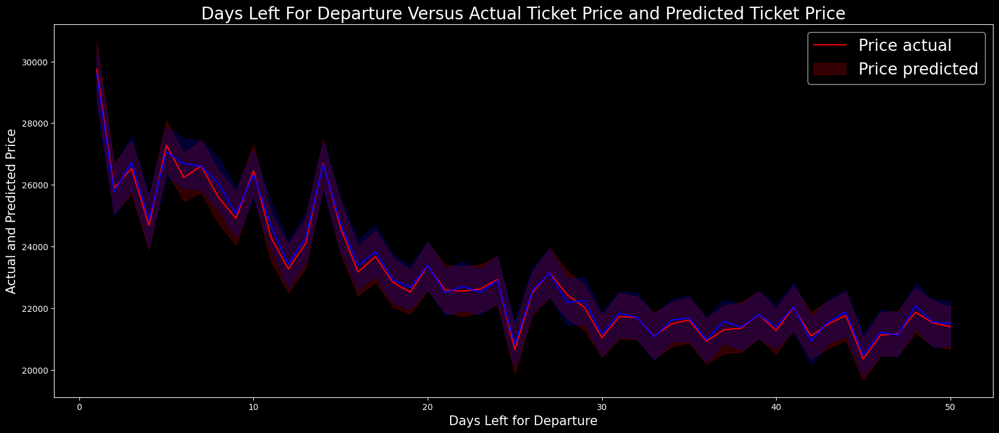

In [35]:
plt.figure(figsize=(20,8))
sns.lineplot(data=result,x='Days_left',y='Price_actual',color='red')
sns.lineplot(data=result,x='Days_left',y='Price_pred',color='blue')
plt.title('Days Left For Departure Versus Actual Ticket Price and Predicted Ticket Price',fontsize=20)
plt.legend(labels=['Price actual','Price predicted'],fontsize=19)
plt.xlabel('Days Left for Departure',fontsize=15)
plt.ylabel('Actual and Predicted Price',fontsize=15)
plt.show()

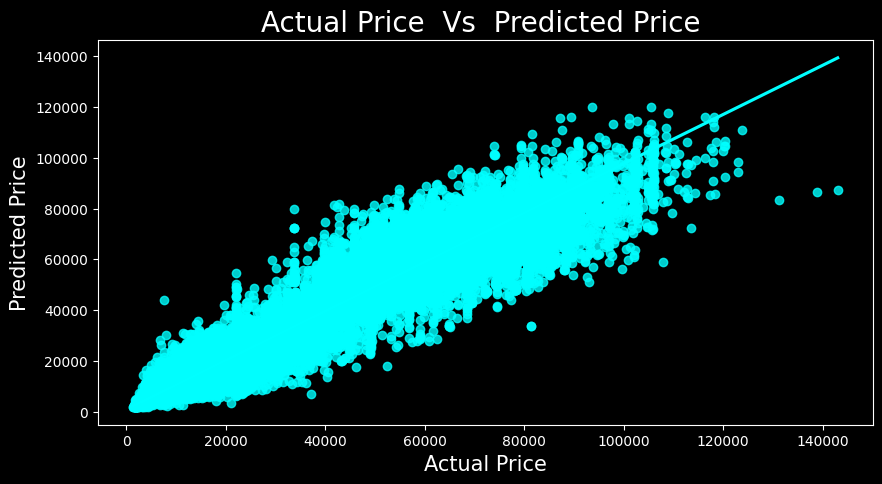

In [36]:
plt.figure(figsize=(10,5))
sns.regplot(x='Price_actual',y='Price_pred',data=result,color='cyan')
plt.title('Actual Price  Vs  Predicted Price ',fontsize=20)
plt.xlabel('Actual Price',fontsize=15)
plt.ylabel('Predicted Price',fontsize=15)
plt.show()